<h1>Custom instance model training using YOLOv8</h1>
<p>
This code walks you through the process of training a custom YOLO v8 model using your own data. 

If you already have annotations in COCO format JSON file, for example by annotating using [makesense](https://www.makesense.ai/) then the annotations can be imported to Roboflow for conversion to YOLO format. Otherwise, if you are starting from scratch, just annotate datasets on [Roboflow](https://roboflow.com/). You just need to upload your images along with the JSON file and Roboflow will convert them to any other format, in our case YOLO v8. <p>

For information about YOLO models: <p>
https://docs.ultralytics.com/models/yolov8/#key-features
<p>


<h3>Imports</h3>

Besides ultralytics, all other libraries should be pre-installed on Google Colab. If you are working on a local system, please make sure you install matplotlib, Pillow, numpy and Seaborn. You may also want to install pandas and other libraries depending on the task.

In [2]:
from ultralytics import YOLO
from matplotlib import pyplot as plt
from PIL import Image

<h3>Import a model and populate it with pre-trained weights</h3>
Here, we are importing an instance segmentation model with weights. For a list of pre-trained models, checkout [YOLOv8 documentation]( https://docs.ultralytics.com/models/yolov8/#key-features)

In [2]:
#Instance
model = YOLO('yolov8n-seg.yaml')  # build a new model from YAML
model = YOLO('yolov8n-seg.pt')  # Transfer the weights from a pretrained model (recommended for training)


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

100%|██████████| 6.73M/6.73M [00:00<00:00, 16.6MB/s]


Let us load the YAML file that contains the names of our classes, number of classes and the directories for train, valid, and test datasets, respectively.

In [3]:
# This is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
yaml_file = "./datasets/yolo_dataset/data.yaml"

In [4]:
# define number of classes based on YAML
import yaml
with open(yaml_file, 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

<h3>Model training</h3>

In order to leverage GPU acceleration you will need to install pytorch pytorchvision and cudatoolkit==(your_installed version) in your virtual environment prior to installing the ultralytics package, otherwise it will default to CPU training

In [5]:
# Define a project --> Destination directory for all results
project = "./YOLOV8-data/results"
# Define subdirectory for this specific training
name = "200_epochs_GPU_cle.eroded_labels-" # Note that if you run the training again, it creates a directory: 200_epochs-2

In [6]:
# Train the model
results = model.train(data=yaml_file,
                      project=project,
                      name=name,
                      epochs=200,
                      patience=0, # I am setting patience=0 to disable early stopping.
                      batch=4,
                      imgsz=800)

New https://pypi.org/project/ultralytics/8.1.9 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.2 🚀 Python-3.9.18 torch-2.1.2 CUDA:0 (NVIDIA GeForce RTX 3070, 8192MiB)
engine\trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=./datasets/yolo_dataset/data.yaml, epochs=200, time=None, patience=0, batch=4, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=./YOLOV8-data/results, name=200_epochs_GPU_cle.eroded_labels-, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, class

100%|██████████| 6.23M/6.23M [00:00<00:00, 18.0MB/s]


AMP: checks passed ✅


train: Scanning C:\Users\alber.DESKTOP-VIFBJNG\PythonProjects\bf_intorg_YOLOv8_dev\datasets\datasets\yolo_dataset\train\labels... 95 images, 0 backgrounds, 0 corrupt: 100%|██████████| 95/95 [00:00<00:00, 134.01it/s]

train: New cache created: C:\Users\alber.DESKTOP-VIFBJNG\PythonProjects\bf_intorg_YOLOv8_dev\datasets\datasets\yolo_dataset\train\labels.cache



val: Scanning C:\Users\alber.DESKTOP-VIFBJNG\PythonProjects\bf_intorg_YOLOv8_dev\datasets\datasets\yolo_dataset\valid\labels... 24 images, 0 backgrounds, 0 corrupt: 100%|██████████| 24/24 [00:00<00:00, 118.12it/s]

val: New cache created: C:\Users\alber.DESKTOP-VIFBJNG\PythonProjects\bf_intorg_YOLOv8_dev\datasets\datasets\yolo_dataset\valid\labels.cache


Plotting labels to YOLOV8-data\results\200_epochs_GPU_cle.eroded_labels-\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
200 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/200      10.6G      1.743      3.774      4.025      1.128       1359        800: 100%|██████████| 24/24 [00:39<00:00,  1.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]

                   all         24       5878     0.0149     0.0195     0.0106    0.00474       0.02     0.0273     0.0138    0.00521



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/200      13.3G      1.444      2.851      3.274      0.942       1133        800: 100%|██████████| 24/24 [00:38<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.06it/s]

                   all         24       5878      0.116      0.151       0.11     0.0485      0.115      0.156      0.106     0.0497



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/200      13.1G       1.43      2.697      2.696     0.9231       1435        800: 100%|██████████| 24/24 [00:37<00:00,  1.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.75s/it]

                   all         24       5878      0.244      0.325      0.247      0.126      0.209       0.28      0.219      0.104



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/200      10.5G      1.463       2.66      2.344     0.9145        937        800: 100%|██████████| 24/24 [00:34<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]

                   all         24       5878      0.407      0.391      0.353      0.203      0.359      0.329      0.294      0.152



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/200      10.2G      1.477      2.624      2.153     0.9182       1560        800: 100%|██████████| 24/24 [00:22<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.08s/it]

                   all         24       5878      0.484      0.437      0.421      0.293      0.428      0.371       0.35      0.216



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/200      9.97G      1.523      2.545      1.934     0.9092       1687        800: 100%|██████████| 24/24 [00:48<00:00,  2.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.56s/it]

                   all         24       5878      0.491      0.471      0.453      0.315       0.48      0.374      0.375      0.221



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/200      8.11G      1.568      2.565       1.82     0.9115       1448        800: 100%|██████████| 24/24 [00:19<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.23it/s]

                   all         24       5878       0.53       0.53      0.505       0.32      0.463      0.434      0.407      0.223



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/200      11.7G      1.418      2.449      1.685     0.9011        653        800: 100%|██████████| 24/24 [05:19<00:00, 13.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.99s/it]

                   all         24       5878      0.554      0.553      0.526      0.345      0.485      0.469       0.44      0.274



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/200       9.2G      1.384      2.468      1.571     0.8937       1007        800: 100%|██████████| 24/24 [01:38<00:00,  4.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.00s/it]

                   all         24       5878      0.593      0.573      0.557      0.368      0.522      0.473      0.449      0.257



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/200      9.98G      1.378      2.421      1.519     0.9019       1667        800: 100%|██████████| 24/24 [00:28<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.15s/it]

                   all         24       5878      0.603      0.605      0.574      0.365      0.553      0.497      0.475      0.273



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/200      7.77G       1.36      2.353      1.437     0.8928       1447        800: 100%|██████████| 24/24 [00:41<00:00,  1.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.28s/it]

                   all         24       5878       0.62      0.601      0.589      0.404      0.567      0.485      0.473      0.257



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/200      10.2G      1.324      2.282      1.368     0.8913        704        800: 100%|██████████| 24/24 [00:25<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.20it/s]

                   all         24       5878      0.645      0.603      0.603      0.419      0.568        0.5      0.487       0.28



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/200      8.64G      1.254      2.326      1.322     0.8851       1180        800: 100%|██████████| 24/24 [00:20<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.22it/s]

                   all         24       5878      0.647      0.626      0.628      0.437       0.55      0.508      0.494      0.284



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/200      12.3G      1.295      2.307      1.268     0.8889        744        800: 100%|██████████| 24/24 [00:35<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.46s/it]

                   all         24       5878      0.656      0.622      0.626       0.44      0.576      0.499      0.499      0.276



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/200      8.93G      1.245      2.218      1.251     0.8869       1712        800: 100%|██████████| 24/24 [00:20<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.80it/s]

                   all         24       5878      0.651      0.627      0.635      0.439      0.572      0.513      0.516      0.301



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/200      13.5G      1.172      2.266      1.236      0.884       1128        800: 100%|██████████| 24/24 [00:47<00:00,  1.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.21s/it]

                   all         24       5878      0.655      0.638      0.651      0.463      0.581      0.507      0.521      0.309



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/200      6.72G      1.172      2.178      1.164     0.8811       1290        800: 100%|██████████| 24/24 [00:14<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.80it/s]

                   all         24       5878      0.657      0.643      0.659      0.467       0.56      0.517      0.527      0.298



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/200      10.1G      1.146      2.287      1.163     0.8746       1159        800: 100%|██████████| 24/24 [00:32<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.75s/it]

                   all         24       5878      0.648      0.639      0.652      0.464      0.575      0.522      0.534      0.318



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/200       6.9G      1.101      2.186       1.13     0.8777       1483        800: 100%|██████████| 24/24 [00:26<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.90it/s]

                   all         24       5878      0.648      0.638      0.654      0.468      0.574      0.493      0.519      0.292



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/200        12G      1.169      2.235      1.135     0.8816       1476        800: 100%|██████████| 24/24 [00:43<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]

                   all         24       5878      0.648      0.646      0.664      0.465      0.569      0.496      0.524      0.296



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/200      13.3G       1.12      2.282      1.115     0.8707        616        800: 100%|██████████| 24/24 [00:40<00:00,  1.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.73s/it]

                   all         24       5878       0.67      0.652      0.681      0.486      0.587      0.519      0.539      0.298



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/200      12.4G      1.069      2.171        1.1      0.873        801        800: 100%|██████████| 24/24 [00:36<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.09it/s]

                   all         24       5878      0.684      0.643      0.691      0.491      0.602      0.511      0.552      0.302



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/200        11G      1.069      2.127      1.051     0.8802        836        800: 100%|██████████| 24/24 [00:34<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.52s/it]

                   all         24       5878      0.651      0.642      0.683      0.503      0.576      0.505      0.553      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/200      11.2G      1.069      2.123      1.038     0.8679       1235        800: 100%|██████████| 24/24 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.30s/it]

                   all         24       5878      0.661      0.642      0.688      0.495      0.574      0.497      0.547      0.306



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/200      9.49G      1.049      2.114       1.02     0.8667        926        800: 100%|██████████| 24/24 [00:34<00:00,  1.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  2.00s/it]

                   all         24       5878      0.694      0.644        0.7      0.489      0.611      0.516      0.557      0.297



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/200      10.7G      1.076      2.196      1.005     0.8642       1539        800: 100%|██████████| 24/24 [00:23<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.04s/it]

                   all         24       5878      0.697      0.653      0.707      0.512      0.614      0.522      0.567      0.312



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/200      9.31G      1.051      2.102     0.9999     0.8657       1580        800: 100%|██████████| 24/24 [00:40<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.08s/it]

                   all         24       5878      0.687      0.629      0.694      0.509      0.594      0.508      0.564       0.33



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/200      11.2G      1.061      2.189      1.026     0.8721       1089        800: 100%|██████████| 24/24 [00:31<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.20s/it]

                   all         24       5878      0.689      0.645      0.708      0.512      0.604      0.515      0.574      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/200      11.9G      1.066      2.147     0.9919     0.8695       1352        800: 100%|██████████| 24/24 [00:47<00:00,  1.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]

                   all         24       5878      0.675      0.647      0.709      0.501      0.597      0.518      0.561      0.298



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/200      12.3G      1.058      2.125     0.9865     0.8626       1487        800: 100%|██████████| 24/24 [00:41<00:00,  1.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]

                   all         24       5878      0.692      0.662      0.727      0.533      0.625      0.533      0.584      0.328



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/200      13.3G      1.002      2.127     0.9563     0.8622        985        800: 100%|██████████| 24/24 [00:33<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]

                   all         24       5878      0.736      0.668      0.736      0.548      0.637      0.533      0.591      0.342



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/200      5.65G      1.017      2.078     0.9663     0.8648       1147        800: 100%|██████████| 24/24 [00:39<00:00,  1.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.14it/s]

                   all         24       5878      0.724      0.655      0.726       0.52      0.643      0.507      0.573      0.316



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/200      13.8G      1.009      1.984      0.927     0.8633        826        800: 100%|██████████| 24/24 [00:39<00:00,  1.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]

                   all         24       5878      0.734      0.672      0.745      0.548      0.656      0.536      0.605      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/200      8.42G      1.035      2.002     0.9267     0.8637        826        800: 100%|██████████| 24/24 [00:43<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.18it/s]

                   all         24       5878      0.729      0.676      0.747      0.549       0.66      0.533      0.606      0.341



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/200      13.6G      1.053      2.035     0.9616     0.8635       1760        800: 100%|██████████| 24/24 [00:32<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]

                   all         24       5878      0.735      0.658      0.737      0.533       0.65      0.532      0.596      0.333



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/200      11.2G      1.054      2.091     0.9425     0.8661       1293        800: 100%|██████████| 24/24 [00:30<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.03s/it]

                   all         24       5878      0.751      0.665      0.748      0.539      0.653      0.548      0.606      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/200      8.45G      1.065      2.102     0.9503     0.8619        825        800: 100%|██████████| 24/24 [00:17<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all         24       5878      0.751      0.664      0.748      0.547      0.666      0.543      0.608      0.341



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/200      8.23G      1.003      2.099     0.9311     0.8602       1835        800: 100%|██████████| 24/24 [00:23<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.02it/s]

                   all         24       5878      0.748      0.678      0.757      0.559       0.67      0.554      0.621      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/200      8.93G      1.038      2.092      0.947     0.8619       1199        800: 100%|██████████| 24/24 [00:34<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.43s/it]

                   all         24       5878      0.754       0.69      0.767      0.554      0.641      0.548      0.604      0.321



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/200      10.4G      1.005      1.938     0.9076     0.8538       1469        800: 100%|██████████| 24/24 [00:32<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.09it/s]

                   all         24       5878      0.754      0.688      0.763       0.55      0.648       0.54      0.601      0.322



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/200      7.37G      1.027      1.972     0.9063     0.8593       1107        800: 100%|██████████| 24/24 [00:32<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.22it/s]

                   all         24       5878      0.772      0.675      0.763      0.565      0.666      0.551      0.614      0.353



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/200      8.96G     0.9895      1.975     0.9019     0.8562       1071        800: 100%|██████████| 24/24 [00:44<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.27s/it]

                   all         24       5878      0.754      0.681      0.757      0.558      0.659       0.55      0.614      0.341



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/200       8.2G      1.032       1.99     0.9076     0.8582        374        800: 100%|██████████| 24/24 [00:16<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all         24       5878      0.734      0.667      0.752      0.565      0.644       0.56      0.625       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/200      9.59G      0.992      2.012     0.8996     0.8532       1677        800: 100%|██████████| 24/24 [00:18<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.56it/s]

                   all         24       5878       0.75      0.685      0.762      0.565      0.649      0.552      0.613      0.347



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/200      10.4G     0.9608      1.973     0.8852     0.8525        857        800: 100%|██████████| 24/24 [00:17<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.09it/s]

                   all         24       5878      0.762      0.699      0.772      0.567       0.66      0.548      0.612      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/200      10.6G     0.9544      2.028     0.8761     0.8506       1106        800: 100%|██████████| 24/24 [00:41<00:00,  1.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.09it/s]

                   all         24       5878      0.763      0.691      0.772      0.582      0.691      0.551      0.629       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/200      8.56G     0.9744       2.03     0.8893     0.8524       1030        800: 100%|██████████| 24/24 [00:27<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.45s/it]

                   all         24       5878      0.767      0.699      0.775      0.583      0.673       0.55      0.623      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/200      8.73G     0.9567      1.944      0.879     0.8524        906        800: 100%|██████████| 24/24 [00:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.42s/it]

                   all         24       5878      0.772      0.691      0.773      0.584      0.678      0.551      0.626      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/200      11.7G     0.9785      1.982     0.8615     0.8461       1180        800: 100%|██████████| 24/24 [00:45<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.07s/it]

                   all         24       5878      0.763      0.695      0.774      0.572      0.674      0.548      0.619      0.343



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/200      12.4G     0.9546      1.973     0.8636     0.8527        959        800: 100%|██████████| 24/24 [00:50<00:00,  2.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.14s/it]

                   all         24       5878       0.78      0.685       0.77      0.576       0.67       0.56      0.621      0.359



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/200      12.1G     0.9541      1.998     0.8718     0.8519        725        800: 100%|██████████| 24/24 [00:31<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.12it/s]

                   all         24       5878      0.764      0.696      0.771      0.565      0.676      0.549      0.618      0.341



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/200      11.1G     0.9585      1.957      0.862     0.8543        910        800: 100%|██████████| 24/24 [00:28<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.07s/it]

                   all         24       5878      0.761      0.697       0.77      0.546      0.684      0.545      0.617      0.341



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/200      8.02G     0.9917      1.989     0.8618     0.8535       1907        800: 100%|██████████| 24/24 [00:23<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.47it/s]

                   all         24       5878      0.756      0.689      0.753      0.561      0.635      0.548      0.595       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/200      9.72G     0.9679      1.896     0.8396      0.852       1469        800: 100%|██████████| 24/24 [00:15<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.08it/s]

                   all         24       5878      0.772      0.697      0.765      0.573      0.636      0.554      0.599      0.338



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/200      13.3G     0.9618      1.993     0.8549     0.8493       1335        800: 100%|██████████| 24/24 [00:44<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]

                   all         24       5878      0.777      0.696      0.777      0.585      0.683      0.566      0.631      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/200      10.1G     0.9367      1.902     0.8392     0.8472       1006        800: 100%|██████████| 24/24 [00:33<00:00,  1.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]

                   all         24       5878      0.767      0.698      0.775       0.58      0.684      0.551      0.626      0.349



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/200      11.6G     0.9557      1.947     0.8345     0.8433        765        800: 100%|██████████| 24/24 [00:45<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.05s/it]

                   all         24       5878      0.772      0.691       0.78      0.578      0.687      0.541      0.614      0.346



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/200      9.62G     0.9503      1.955     0.8506     0.8456        602        800: 100%|██████████| 24/24 [00:38<00:00,  1.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.59s/it]

                   all         24       5878      0.756      0.706      0.784      0.588      0.686      0.559      0.633      0.364



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/200      10.5G     0.9543      1.871     0.8142     0.8451        972        800: 100%|██████████| 24/24 [00:35<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.45s/it]

                   all         24       5878      0.774      0.705      0.783      0.586      0.684      0.572      0.638      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/200      10.5G     0.9361      1.911     0.8236     0.8444        614        800: 100%|██████████| 24/24 [00:23<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.03it/s]

                   all         24       5878      0.783      0.699      0.783      0.594      0.677      0.579      0.638      0.372



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/200      12.8G     0.9215      1.897     0.8327       0.85        924        800: 100%|██████████| 24/24 [00:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]

                   all         24       5878      0.794      0.701      0.789      0.584      0.672      0.559      0.621       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/200      8.77G     0.9278      1.874     0.8187     0.8429        607        800: 100%|██████████| 24/24 [00:23<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.44s/it]

                   all         24       5878       0.79      0.706       0.79       0.58      0.679      0.568      0.632      0.344



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/200      12.9G     0.9614      1.917     0.8533     0.8546        833        800: 100%|██████████| 24/24 [00:55<00:00,  2.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.01s/it]

                   all         24       5878      0.784      0.707      0.791      0.595      0.698      0.587      0.657       0.39



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/200      11.3G     0.9661      1.902     0.8172     0.8458       1289        800: 100%|██████████| 24/24 [00:32<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.03it/s]

                   all         24       5878      0.789      0.704      0.789      0.603      0.688      0.577      0.644      0.373



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/200      11.8G      1.006      2.012     0.8606     0.8452       1621        800: 100%|██████████| 24/24 [00:34<00:00,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.22s/it]

                   all         24       5878       0.77      0.707      0.785      0.567       0.65      0.549      0.609       0.33



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/200      13.6G     0.9988      1.948     0.8608     0.8501       2150        800: 100%|██████████| 24/24 [00:37<00:00,  1.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.47s/it]

                   all         24       5878      0.769      0.706      0.784      0.583      0.649      0.558      0.617       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/200      10.7G     0.9504      1.906     0.8216     0.8463       1684        800: 100%|██████████| 24/24 [00:35<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.72s/it]

                   all         24       5878      0.758      0.701      0.771      0.588       0.67      0.567      0.632      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/200       9.5G      1.002      1.893     0.8424     0.8482       1087        800: 100%|██████████| 24/24 [00:26<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all         24       5878      0.769      0.698      0.778      0.587      0.673      0.563       0.63      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/200      10.3G     0.9383      1.886     0.8214     0.8429       1677        800: 100%|██████████| 24/24 [00:31<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.71s/it]

                   all         24       5878      0.772      0.713      0.787      0.582      0.677      0.549      0.611       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/200      12.8G     0.9509      1.918     0.8356     0.8469        700        800: 100%|██████████| 24/24 [00:50<00:00,  2.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.06s/it]

                   all         24       5878      0.797      0.712      0.797      0.604      0.691      0.566      0.632      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/200      8.09G     0.9178      1.887     0.8222     0.8459        726        800: 100%|██████████| 24/24 [00:28<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.01it/s]

                   all         24       5878      0.779      0.711      0.792      0.593      0.686      0.565      0.635      0.349



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/200      9.36G     0.9427      1.831     0.8236     0.8518       1286        800: 100%|██████████| 24/24 [00:34<00:00,  1.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.06it/s]

                   all         24       5878      0.775      0.705      0.785       0.59      0.684      0.569      0.638      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/200      11.8G      0.924        1.9     0.8207     0.8484        563        800: 100%|██████████| 24/24 [00:43<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]

                   all         24       5878      0.807      0.718      0.804      0.608      0.701      0.585       0.65      0.381



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/200        10G     0.9223        1.9      0.812     0.8467       1216        800: 100%|██████████| 24/24 [00:23<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.04it/s]

                   all         24       5878      0.802      0.721      0.805      0.605      0.689      0.575      0.638      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/200       9.7G     0.9524      1.878     0.8237     0.8515       1127        800: 100%|██████████| 24/24 [00:25<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.43s/it]

                   all         24       5878      0.785      0.711      0.791      0.589       0.69       0.56       0.63       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/200      13.8G     0.9158      1.843     0.7978     0.8426       1037        800: 100%|██████████| 24/24 [00:32<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.78s/it]

                   all         24       5878      0.789      0.702      0.791        0.6      0.687      0.584      0.642      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/200      13.6G      0.937      1.882     0.7977     0.8429       1062        800: 100%|██████████| 24/24 [00:41<00:00,  1.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]

                   all         24       5878      0.793      0.691      0.786      0.595      0.694      0.559      0.627      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/200      10.6G     0.9042      1.851     0.7941     0.8403       1826        800: 100%|██████████| 24/24 [00:27<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.20s/it]

                   all         24       5878      0.791      0.705      0.791      0.589      0.664      0.563      0.622      0.339



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/200      12.7G     0.9478      1.896     0.8062     0.8419       1321        800: 100%|██████████| 24/24 [00:41<00:00,  1.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.46s/it]

                   all         24       5878      0.795      0.706      0.797        0.6      0.701      0.574       0.65      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/200      6.99G     0.9354      1.855      0.783     0.8383       1491        800: 100%|██████████| 24/24 [00:08<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.54it/s]

                   all         24       5878      0.793      0.702      0.795      0.601      0.698      0.576       0.65      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/200      12.5G     0.9378      1.844     0.7906     0.8409        807        800: 100%|██████████| 24/24 [00:33<00:00,  1.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.55s/it]

                   all         24       5878      0.787      0.708      0.794      0.593      0.678      0.557      0.625      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/200      12.6G     0.9232      1.925     0.7954       0.84       1949        800: 100%|██████████| 24/24 [00:32<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.14s/it]

                   all         24       5878      0.784      0.711      0.792      0.597      0.692      0.561      0.637      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/200      13.1G     0.9078      1.892     0.7951     0.8451       1160        800: 100%|██████████| 24/24 [00:27<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.19it/s]

                   all         24       5878      0.781      0.701      0.781      0.594      0.666      0.559      0.623      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/200      13.2G     0.9094      1.823     0.7937      0.846        951        800: 100%|██████████| 24/24 [00:28<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.08it/s]

                   all         24       5878      0.784      0.702      0.784      0.595      0.673      0.559      0.623      0.346



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/200      12.2G     0.9229      1.912     0.7898     0.8407       1504        800: 100%|██████████| 24/24 [00:38<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.55s/it]

                   all         24       5878      0.796       0.71      0.797      0.601      0.705      0.577      0.644      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/200      10.6G     0.8951      1.841     0.7673     0.8373        627        800: 100%|██████████| 24/24 [00:27<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.02s/it]

                   all         24       5878      0.791      0.705      0.792        0.6      0.696      0.569      0.633      0.353



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/200      12.3G     0.8862      1.768     0.7644     0.8412        782        800: 100%|██████████| 24/24 [00:39<00:00,  1.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]

                   all         24       5878      0.788      0.721      0.796      0.614      0.689      0.569      0.639       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/200      10.5G     0.9319      1.951      0.794     0.8388        671        800: 100%|██████████| 24/24 [00:34<00:00,  1.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]

                   all         24       5878      0.782      0.724      0.798       0.61      0.694      0.575      0.644      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/200      11.5G     0.8936      1.848     0.7812     0.8393        877        800: 100%|██████████| 24/24 [00:38<00:00,  1.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]

                   all         24       5878      0.783      0.709      0.796      0.584      0.666      0.569      0.627      0.342



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/200      8.67G     0.8758      1.755     0.7648     0.8482        665        800: 100%|██████████| 24/24 [00:27<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.48s/it]

                   all         24       5878      0.782      0.721      0.801      0.601      0.677       0.57      0.632      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/200      11.2G     0.9001       1.85      0.777     0.8414       1235        800: 100%|██████████| 24/24 [00:42<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]

                   all         24       5878      0.804      0.708      0.801      0.614      0.706      0.579       0.65      0.381



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/200      8.12G     0.9123      1.866     0.7849       0.84       1277        800: 100%|██████████| 24/24 [00:36<00:00,  1.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.13it/s]

                   all         24       5878      0.798      0.718      0.804       0.61        0.7      0.575      0.646      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/200      8.85G      0.875      1.814     0.7637       0.84       1233        800: 100%|██████████| 24/24 [00:27<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]

                   all         24       5878      0.803      0.712      0.804      0.614      0.683      0.575      0.638      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/200      11.3G     0.8773      1.822     0.7667     0.8379       1436        800: 100%|██████████| 24/24 [00:34<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.54s/it]

                   all         24       5878      0.809      0.719      0.808      0.618      0.694      0.578      0.644      0.374



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/200      9.96G     0.8856      1.831     0.7758     0.8403        717        800: 100%|██████████| 24/24 [00:34<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]

                   all         24       5878      0.797      0.714      0.804      0.597        0.7      0.558      0.632      0.346



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/200      10.6G     0.8768      1.798     0.7663     0.8394        564        800: 100%|██████████| 24/24 [00:23<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.61it/s]

                   all         24       5878      0.793      0.706      0.802      0.601      0.684      0.571      0.636       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/200      8.28G      0.897      1.865     0.7741     0.8386       1125        800: 100%|██████████| 24/24 [00:37<00:00,  1.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.23s/it]

                   all         24       5878      0.812      0.719      0.808      0.619      0.691      0.584      0.645      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/200      9.35G     0.8646      1.773     0.7529     0.8379        667        800: 100%|██████████| 24/24 [00:31<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.59s/it]

                   all         24       5878      0.802      0.723      0.807      0.613      0.688      0.566      0.635      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/200      12.3G     0.9167      1.856     0.7711     0.8377       1821        800: 100%|██████████| 24/24 [00:24<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.08it/s]

                   all         24       5878      0.796      0.718      0.802      0.611      0.685      0.577      0.639      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/200      11.3G     0.8682      1.809     0.7605     0.8388       1430        800: 100%|██████████| 24/24 [00:28<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.02it/s]

                   all         24       5878      0.798      0.715      0.801      0.613      0.686      0.583      0.642      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    101/200      9.29G     0.8975      1.792     0.7559     0.8374        607        800: 100%|██████████| 24/24 [00:26<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.25s/it]

                   all         24       5878      0.795      0.709      0.797      0.603      0.689       0.57      0.637      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    102/200      12.3G     0.9111      1.818     0.7675     0.8371       1055        800: 100%|██████████| 24/24 [00:45<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]

                   all         24       5878      0.796      0.707      0.794      0.598      0.685      0.572      0.637      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    103/200      6.81G     0.9063      1.777     0.7581     0.8373        742        800: 100%|██████████| 24/24 [00:33<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]

                   all         24       5878      0.784      0.719      0.796      0.609      0.679      0.574      0.636      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    104/200      11.5G     0.8659       1.74     0.7516     0.8388        749        800: 100%|██████████| 24/24 [00:35<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.82s/it]

                   all         24       5878       0.79      0.722      0.799      0.603      0.683       0.56      0.626       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    105/200      7.11G     0.8916       1.79     0.7619     0.8368       1106        800: 100%|██████████| 24/24 [00:37<00:00,  1.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.54s/it]

                   all         24       5878      0.796      0.727      0.803      0.612      0.697      0.567      0.636       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    106/200      10.5G     0.9218      1.883     0.7777     0.8416       1118        800: 100%|██████████| 24/24 [00:36<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.09it/s]

                   all         24       5878      0.801      0.726      0.805      0.624      0.686      0.589      0.647      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    107/200      8.35G     0.9176      1.839     0.7656     0.8394       1265        800: 100%|██████████| 24/24 [00:25<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]

                   all         24       5878      0.783       0.72      0.796      0.607      0.686       0.57      0.633      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    108/200      10.4G     0.8716       1.78     0.7488      0.838        547        800: 100%|██████████| 24/24 [00:24<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.12it/s]

                   all         24       5878      0.787      0.704      0.794      0.596      0.688      0.556      0.629      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    109/200      12.9G     0.8475      1.742     0.7377     0.8358        720        800: 100%|██████████| 24/24 [00:45<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.00s/it]

                   all         24       5878      0.782      0.701       0.79      0.604      0.686       0.56      0.627      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    110/200      11.2G     0.8659      1.819      0.756     0.8387        943        800: 100%|██████████| 24/24 [00:36<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.95s/it]

                   all         24       5878      0.781      0.704      0.789      0.609      0.679      0.574      0.638      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    111/200        13G     0.8775      1.778     0.7511      0.834       1815        800: 100%|██████████| 24/24 [00:32<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.46s/it]

                   all         24       5878      0.802      0.728      0.808       0.61      0.699      0.579      0.646      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    112/200      12.8G     0.8914      1.796     0.7576     0.8361       1069        800: 100%|██████████| 24/24 [00:38<00:00,  1.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.95s/it]

                   all         24       5878      0.793      0.724      0.805      0.603      0.688      0.566      0.637      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    113/200      8.67G     0.8309      1.809     0.7393     0.8326        681        800: 100%|██████████| 24/24 [00:17<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.03s/it]

                   all         24       5878      0.797      0.709      0.802      0.618      0.677      0.565      0.634      0.359



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    114/200      8.88G     0.9002      1.804     0.7475     0.8355       1278        800: 100%|██████████| 24/24 [00:14<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]

                   all         24       5878      0.791       0.71      0.802      0.613       0.68      0.563      0.633      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    115/200      9.43G      0.825      1.724     0.7284     0.8359        841        800: 100%|██████████| 24/24 [00:41<00:00,  1.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.01s/it]

                   all         24       5878      0.801      0.726       0.81      0.617      0.686      0.564      0.635      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    116/200      13.5G     0.8549      1.747     0.7414     0.8362        580        800: 100%|██████████| 24/24 [00:39<00:00,  1.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.56s/it]

                   all         24       5878      0.798      0.725      0.805      0.619      0.681      0.567       0.63      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    117/200      11.5G     0.8574      1.784     0.7347      0.833        408        800: 100%|██████████| 24/24 [00:34<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]

                   all         24       5878      0.793      0.719      0.806       0.61      0.697      0.568      0.639      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    118/200      5.54G     0.8492       1.77     0.7325     0.8347        750        800: 100%|██████████| 24/24 [00:48<00:00,  2.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.55it/s]

                   all         24       5878      0.782      0.721      0.805      0.602      0.685      0.573      0.636      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    119/200      12.4G     0.8731      1.713     0.7286     0.8307       1192        800: 100%|██████████| 24/24 [00:34<00:00,  1.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.99s/it]

                   all         24       5878        0.8      0.726      0.811      0.624      0.707      0.588      0.656      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    120/200        14G     0.9004      1.765     0.7362      0.838        848        800: 100%|██████████| 24/24 [00:29<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.03it/s]

                   all         24       5878      0.804      0.719      0.809      0.625      0.702      0.589      0.657      0.387



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    121/200      5.18G     0.8747      1.809      0.744     0.8302       1711        800: 100%|██████████| 24/24 [00:37<00:00,  1.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]

                   all         24       5878      0.787      0.726      0.804      0.615      0.703      0.569      0.643      0.364



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    122/200      13.1G     0.8909      1.733     0.7329     0.8297       1208        800: 100%|██████████| 24/24 [00:25<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all         24       5878      0.798      0.721      0.806      0.618      0.697       0.58      0.648       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    123/200      9.19G     0.8556      1.724     0.7319     0.8315       1251        800: 100%|██████████| 24/24 [00:12<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.51s/it]

                   all         24       5878      0.801      0.729      0.812      0.626      0.706      0.587      0.651      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    124/200      8.72G     0.8881      1.737     0.7286      0.831       1945        800: 100%|██████████| 24/24 [00:20<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         24       5878      0.798      0.724      0.807      0.618      0.686      0.576      0.641      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    125/200      6.34G     0.8561      1.694     0.7228     0.8323        971        800: 100%|██████████| 24/24 [00:13<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.31it/s]

                   all         24       5878      0.787      0.719      0.799      0.612      0.685       0.56      0.632      0.359



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    126/200      7.57G     0.8689      1.696     0.7176     0.8306        676        800: 100%|██████████| 24/24 [00:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.55it/s]

                   all         24       5878      0.793       0.71        0.8      0.613      0.682      0.565      0.634      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    127/200      6.82G     0.8488      1.705     0.7253     0.8318        757        800: 100%|██████████| 24/24 [00:45<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.10s/it]

                   all         24       5878      0.791       0.72      0.803      0.606      0.692      0.549      0.629      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    128/200      8.23G     0.8622      1.692     0.7175     0.8316        821        800: 100%|██████████| 24/24 [00:19<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all         24       5878      0.805      0.714      0.806      0.613       0.68      0.568      0.633      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    129/200       8.2G     0.8189       1.69     0.7123     0.8345        569        800: 100%|██████████| 24/24 [00:17<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.59it/s]

                   all         24       5878       0.81       0.71      0.808      0.621      0.704      0.568      0.641      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    130/200      11.6G     0.8679      1.735     0.7306     0.8311        758        800: 100%|██████████| 24/24 [00:25<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.46s/it]

                   all         24       5878      0.806      0.712      0.806      0.618      0.685      0.567      0.634      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    131/200      12.2G     0.8615      1.705     0.7146     0.8326       1419        800: 100%|██████████| 24/24 [00:38<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]

                   all         24       5878      0.797      0.721      0.806      0.607      0.701      0.568      0.639      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    132/200      13.1G     0.8678      1.693     0.7206     0.8318       1374        800: 100%|██████████| 24/24 [00:33<00:00,  1.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.15s/it]

                   all         24       5878      0.796      0.726      0.809      0.613      0.696      0.584       0.65      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    133/200      11.4G     0.8504      1.632     0.7112     0.8326        933        800: 100%|██████████| 24/24 [00:22<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.51s/it]

                   all         24       5878      0.794       0.73      0.809      0.618      0.706      0.568      0.643      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    134/200      13.9G     0.8639      1.727     0.7268     0.8319        577        800: 100%|██████████| 24/24 [00:36<00:00,  1.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]

                   all         24       5878      0.795       0.73      0.809      0.617      0.688       0.57      0.635       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    135/200      12.8G     0.8893      1.769     0.7382     0.8299        864        800: 100%|██████████| 24/24 [00:41<00:00,  1.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]

                   all         24       5878      0.805      0.723      0.812      0.623      0.679       0.56      0.623      0.349



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    136/200      11.4G      0.907      1.748      0.736     0.8337       1672        800: 100%|██████████| 24/24 [00:20<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all         24       5878      0.798      0.732      0.813       0.63      0.681      0.561      0.628      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    137/200      9.85G     0.8845      1.729      0.715      0.833       1137        800: 100%|██████████| 24/24 [00:33<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.51s/it]

                   all         24       5878      0.799      0.718      0.804      0.622      0.669      0.558      0.623      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    138/200      12.2G      0.822      1.639     0.7002     0.8372        614        800: 100%|██████████| 24/24 [00:32<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.98s/it]

                   all         24       5878      0.802      0.713      0.799      0.614       0.67      0.554      0.621      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    139/200       8.9G     0.8556      1.727      0.711     0.8309        759        800: 100%|██████████| 24/24 [00:38<00:00,  1.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.34s/it]

                   all         24       5878      0.791       0.72      0.801       0.59      0.684      0.534      0.612      0.339



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    140/200      10.9G     0.9257      1.767     0.7323     0.8327        563        800: 100%|██████████| 24/24 [00:32<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.73s/it]

                   all         24       5878      0.799      0.714      0.803      0.596      0.685      0.535      0.613      0.338



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    141/200      12.3G     0.8479      1.722     0.7247     0.8326        833        800: 100%|██████████| 24/24 [00:32<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.72s/it]

                   all         24       5878      0.804      0.721      0.809      0.624        0.7      0.565      0.641      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    142/200      9.04G     0.8318      1.685     0.7075     0.8285        778        800: 100%|██████████| 24/24 [00:24<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.46s/it]

                   all         24       5878      0.796      0.733       0.81      0.625      0.705      0.568      0.646      0.374



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    143/200       9.4G     0.8263      1.714     0.7062     0.8294        921        800: 100%|██████████| 24/24 [00:26<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.48s/it]

                   all         24       5878      0.798      0.727      0.809      0.624      0.704      0.569      0.647       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    144/200      11.4G     0.8498      1.731     0.7289     0.8341        681        800: 100%|██████████| 24/24 [00:39<00:00,  1.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.43s/it]

                   all         24       5878      0.793      0.724      0.807      0.621      0.692      0.577      0.645      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    145/200      11.6G     0.8308      1.693     0.7144     0.8337        759        800: 100%|██████████| 24/24 [00:34<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]

                   all         24       5878      0.804      0.722      0.809      0.627      0.702      0.576      0.651      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    146/200      9.24G     0.8422       1.72     0.7191      0.831        882        800: 100%|██████████| 24/24 [00:29<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.33it/s]

                   all         24       5878      0.792      0.722      0.806      0.623      0.706      0.563      0.647      0.372



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    147/200       8.5G     0.8815      1.725     0.7349     0.8292        670        800: 100%|██████████| 24/24 [00:17<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.38it/s]

                   all         24       5878      0.795       0.72      0.805      0.615      0.694      0.572      0.645      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    148/200      11.4G     0.8664      1.693     0.7111     0.8322        875        800: 100%|██████████| 24/24 [00:37<00:00,  1.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.06it/s]

                   all         24       5878      0.795       0.72      0.805      0.615      0.699      0.577       0.65      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    149/200      13.9G     0.8535      1.706     0.7059     0.8314        657        800: 100%|██████████| 24/24 [00:43<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.83s/it]

                   all         24       5878      0.802      0.734      0.813      0.614      0.711      0.573      0.649      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    150/200      10.8G     0.8487       1.68     0.7072     0.8323       1094        800: 100%|██████████| 24/24 [00:42<00:00,  1.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.99s/it]

                   all         24       5878      0.806      0.732      0.814       0.62      0.709      0.567      0.647      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    151/200      8.14G     0.8609      1.695     0.7111     0.8306        866        800: 100%|██████████| 24/24 [00:22<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]

                   all         24       5878      0.809      0.721      0.813      0.629      0.691      0.579      0.646      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    152/200        14G      0.831      1.631     0.6924     0.8308       1049        800: 100%|██████████| 24/24 [00:27<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.18s/it]

                   all         24       5878      0.808      0.716      0.811      0.625       0.68      0.569      0.636      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    153/200      11.5G      0.871      1.727     0.7073     0.8297       1074        800: 100%|██████████| 24/24 [00:49<00:00,  2.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.74s/it]

                   all         24       5878      0.796      0.737      0.814      0.628      0.697      0.556      0.633      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    154/200      9.97G     0.8189      1.634     0.6866     0.8281        868        800: 100%|██████████| 24/24 [00:16<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.21s/it]

                   all         24       5878      0.799      0.734      0.813      0.632      0.703      0.563      0.641      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    155/200      12.5G     0.8447       1.67     0.7024       0.83        732        800: 100%|██████████| 24/24 [00:40<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.01s/it]

                   all         24       5878      0.801      0.731      0.812      0.633      0.699      0.571      0.645      0.375



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    156/200      10.8G     0.8171      1.645     0.6954     0.8317       1030        800: 100%|██████████| 24/24 [00:25<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.13s/it]

                   all         24       5878      0.798      0.733      0.812      0.627       0.69       0.57       0.64      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    157/200      9.48G     0.8337      1.613     0.6943     0.8315       1161        800: 100%|██████████| 24/24 [00:19<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.51it/s]

                   all         24       5878      0.796      0.731      0.811      0.613      0.667      0.563      0.626      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    158/200      12.1G     0.8658      1.677     0.7051     0.8295       1972        800: 100%|██████████| 24/24 [00:36<00:00,  1.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.46s/it]

                   all         24       5878      0.801      0.728      0.813      0.617      0.682      0.566      0.634      0.353



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    159/200      12.6G      0.832       1.67     0.7007     0.8285       1648        800: 100%|██████████| 24/24 [00:33<00:00,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.34s/it]

                   all         24       5878      0.795      0.728       0.81      0.618      0.706      0.569      0.648       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    160/200      10.6G     0.8538       1.65     0.6944     0.8271       1012        800: 100%|██████████| 24/24 [00:24<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.24it/s]

                   all         24       5878      0.798      0.725      0.807       0.62      0.699      0.569      0.644       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    161/200      9.45G     0.8815      1.697      0.707      0.829       1286        800: 100%|██████████| 24/24 [00:34<00:00,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.53it/s]

                   all         24       5878      0.803      0.726      0.809       0.62      0.695      0.565      0.639       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    162/200      9.58G     0.8329      1.643     0.6905     0.8301        751        800: 100%|██████████| 24/24 [00:35<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.70s/it]

                   all         24       5878      0.797      0.724      0.806      0.618      0.695      0.568       0.64      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    163/200      12.3G     0.8103      1.623       0.68     0.8285       1108        800: 100%|██████████| 24/24 [00:35<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]

                   all         24       5878      0.806       0.72      0.807      0.622      0.694      0.564      0.639      0.374



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    164/200      13.3G     0.7977       1.62     0.6843     0.8335       1160        800: 100%|██████████| 24/24 [00:22<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]

                   all         24       5878      0.805      0.725       0.81      0.626       0.69      0.559      0.635      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    165/200      7.67G     0.8293      1.663     0.6878     0.8298       1490        800: 100%|██████████| 24/24 [00:24<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.42it/s]

                   all         24       5878      0.802       0.74      0.817      0.623      0.677       0.56      0.629      0.352



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    166/200      12.3G     0.8149      1.628     0.6881     0.8312       1076        800: 100%|██████████| 24/24 [00:29<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]

                   all         24       5878      0.802       0.74      0.819      0.627      0.686      0.568      0.638      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    167/200      10.3G      0.861      1.705     0.7043      0.829       1208        800: 100%|██████████| 24/24 [00:14<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.13it/s]

                   all         24       5878      0.801      0.726      0.815      0.631        0.7      0.577       0.65      0.373



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    168/200      13.8G     0.8427      1.649     0.6885     0.8287       1409        800: 100%|██████████| 24/24 [00:35<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]

                   all         24       5878      0.807      0.717      0.811      0.627      0.687       0.57      0.641      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    169/200      12.7G      0.821      1.662     0.6927     0.8325        745        800: 100%|██████████| 24/24 [00:38<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]

                   all         24       5878      0.796      0.722       0.81      0.623      0.678      0.554      0.627      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    170/200      10.3G      0.859      1.612     0.6898     0.8291       1371        800: 100%|██████████| 24/24 [00:18<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.56s/it]

                   all         24       5878      0.798      0.726      0.812      0.623      0.679      0.558      0.629      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    171/200      7.51G     0.8632      1.645     0.6856      0.829        653        800: 100%|██████████| 24/24 [00:31<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.15it/s]

                   all         24       5878      0.799      0.728      0.815      0.629      0.695      0.567      0.642      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    172/200      7.38G     0.8681      1.674     0.7009     0.8296        779        800: 100%|██████████| 24/24 [00:15<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.12it/s]

                   all         24       5878      0.798      0.724      0.811      0.626        0.7      0.567      0.643       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    173/200      12.5G     0.8609      1.697     0.7108     0.8291       2016        800: 100%|██████████| 24/24 [00:40<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.70s/it]

                   all         24       5878      0.802      0.724       0.81      0.619      0.693      0.564      0.635      0.359



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    174/200      13.9G     0.8388      1.627     0.6935     0.8301        942        800: 100%|██████████| 24/24 [00:50<00:00,  2.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.07s/it]

                   all         24       5878      0.804       0.73      0.812      0.617      0.694      0.559      0.635      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    175/200      9.96G     0.8359      1.671     0.6935     0.8314        661        800: 100%|██████████| 24/24 [00:37<00:00,  1.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]

                   all         24       5878      0.801      0.736      0.813      0.624      0.684      0.568      0.636      0.364



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    176/200      10.7G     0.8634      1.623     0.6931     0.8308        973        800: 100%|██████████| 24/24 [00:25<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]

                   all         24       5878      0.798      0.739      0.813      0.629      0.695      0.564      0.638      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    177/200      12.2G     0.8176      1.611     0.6868      0.833       1150        800: 100%|██████████| 24/24 [00:41<00:00,  1.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]

                   all         24       5878      0.801      0.723      0.809      0.632      0.686      0.567      0.638      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    178/200       9.9G     0.8239      1.575     0.6757     0.8287        619        800: 100%|██████████| 24/24 [00:39<00:00,  1.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]

                   all         24       5878        0.8      0.723      0.809      0.632       0.69      0.573      0.644      0.373



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    179/200      9.12G     0.8589      1.668     0.6986     0.8263       1008        800: 100%|██████████| 24/24 [00:22<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.03it/s]

                   all         24       5878      0.795      0.725      0.809      0.628      0.692      0.576      0.646      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    180/200      12.4G     0.8296      1.635     0.6866     0.8296        945        800: 100%|██████████| 24/24 [00:46<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]

                   all         24       5878      0.802      0.727      0.812      0.627      0.689      0.574      0.642      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    181/200      11.9G      0.876      1.721      0.714     0.8302       1391        800: 100%|██████████| 24/24 [00:39<00:00,  1.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]

                   all         24       5878      0.805       0.73      0.815      0.621      0.676      0.548      0.621      0.349



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    182/200      8.38G     0.8524      1.645     0.6883     0.8275       1418        800: 100%|██████████| 24/24 [00:19<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.64it/s]

                   all         24       5878      0.809      0.729      0.815      0.621      0.683      0.547      0.623      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    183/200      12.2G     0.8398      1.648     0.6891     0.8295       1407        800: 100%|██████████| 24/24 [00:36<00:00,  1.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]

                   all         24       5878      0.802      0.732      0.815      0.628      0.697       0.56      0.636      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    184/200         7G     0.8199       1.62     0.6805     0.8253       1711        800: 100%|██████████| 24/24 [00:30<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.02it/s]

                   all         24       5878      0.799      0.733      0.813      0.629      0.706      0.567      0.644      0.372



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    185/200      12.1G     0.8593      1.613     0.6818     0.8302        903        800: 100%|██████████| 24/24 [00:48<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]

                   all         24       5878      0.797      0.733      0.813      0.632      0.717       0.57       0.65      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    186/200        12G     0.8514      1.653     0.6852     0.8242        873        800: 100%|██████████| 24/24 [00:23<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.46s/it]

                   all         24       5878      0.801      0.728      0.812      0.631      0.712      0.574      0.649       0.38



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    187/200      12.4G       0.82      1.606     0.6733     0.8281        828        800: 100%|██████████| 24/24 [00:21<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all         24       5878      0.799      0.728      0.811      0.627      0.703      0.565      0.642      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    188/200      6.93G     0.8761      1.703      0.708     0.8308       1759        800: 100%|██████████| 24/24 [00:40<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.13it/s]

                   all         24       5878      0.802      0.729      0.812      0.625      0.698      0.563      0.638      0.364



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    189/200      9.69G     0.8177       1.55     0.6663     0.8268        643        800: 100%|██████████| 24/24 [00:18<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.06it/s]

                   all         24       5878      0.802      0.736      0.814      0.621      0.688      0.565      0.634      0.358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    190/200      10.9G     0.8135      1.565      0.664     0.8237       1416        800: 100%|██████████| 24/24 [00:36<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.79s/it]

                   all         24       5878        0.8      0.737      0.814      0.621      0.691      0.563      0.633      0.357


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    191/200      8.08G     0.8463      1.647     0.7503     0.8256        774        800: 100%|██████████| 24/24 [00:08<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]

                   all         24       5878       0.81      0.719      0.811      0.621      0.691      0.563      0.634      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    192/200      6.47G     0.7972      1.601      0.698     0.8225        424        800: 100%|██████████| 24/24 [00:04<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]

                   all         24       5878      0.799      0.718      0.805      0.618      0.677      0.568      0.631       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    193/200      13.4G     0.8005      1.588     0.6895      0.819        572        800: 100%|██████████| 24/24 [00:13<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.06s/it]

                   all         24       5878      0.793       0.71      0.797      0.617      0.677      0.561      0.629      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    194/200      9.97G     0.8314      1.627     0.7053     0.8217        706        800: 100%|██████████| 24/24 [00:20<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.04s/it]

                   all         24       5878      0.788      0.711      0.797      0.619      0.678       0.56      0.629      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    195/200      12.4G     0.7961      1.585     0.6858     0.8204        611        800: 100%|██████████| 24/24 [00:13<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.95s/it]

                   all         24       5878      0.785      0.718      0.799      0.624      0.686       0.56      0.632      0.372



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    196/200      11.7G     0.7904       1.57     0.6812     0.8255        678        800: 100%|██████████| 24/24 [00:16<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.97s/it]

                   all         24       5878      0.782      0.728      0.801      0.626      0.695      0.555      0.633      0.373



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    197/200      11.5G     0.8027      1.621     0.6856     0.8198        760        800: 100%|██████████| 24/24 [00:13<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.04s/it]

                   all         24       5878      0.792      0.723      0.803      0.626      0.673      0.567      0.633       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    198/200      10.4G     0.7888      1.586     0.6824     0.8204        521        800: 100%|██████████| 24/24 [00:16<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.04s/it]

                   all         24       5878      0.796      0.723      0.803      0.624      0.673      0.569      0.634      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    199/200      8.99G     0.8043      1.567      0.683     0.8237        724        800: 100%|██████████| 24/24 [00:13<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.02s/it]

                   all         24       5878      0.796      0.721      0.803      0.622      0.671      0.569      0.633      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    200/200      8.49G     0.8239      1.554     0.6815     0.8206        842        800: 100%|██████████| 24/24 [00:11<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.06s/it]

                   all         24       5878      0.795      0.722      0.804      0.623      0.682      0.564      0.635      0.364



200 epochs completed in 2.090 hours.
Optimizer stripped from YOLOV8-data\results\200_epochs_GPU_cle.eroded_labels-\weights\last.pt, 6.8MB
Optimizer stripped from YOLOV8-data\results\200_epochs_GPU_cle.eroded_labels-\weights\best.pt, 6.8MB

Validating YOLOV8-data\results\200_epochs_GPU_cle.eroded_labels-\weights\best.pt...
Ultralytics YOLOv8.1.2 🚀 Python-3.9.18 torch-2.1.2 CUDA:0 (NVIDIA GeForce RTX 3070, 8192MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258649 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.04s/it]


                   all         24       5878      0.798      0.734      0.814      0.633      0.717      0.571      0.651      0.383
                  dead         24       1715      0.849      0.651      0.793      0.597      0.691      0.425      0.534      0.275
        differentiated         24       1291      0.705      0.873      0.865      0.709      0.704      0.744      0.766      0.518
      undifferentiated         24       2872       0.84      0.677      0.784      0.593      0.755      0.545      0.652      0.356
Speed: 0.5ms preprocess, 3.6ms inference, 0.0ms loss, 3.4ms postprocess per image
Results saved to YOLOV8-data\results\200_epochs_GPU_cle.eroded_labels-


In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

All training curves, metrics, and other results are stored as images inside <code>./YOLOV8-data/results/200-epochs_GPU-</code>. Let us open a couple of these images.

In [3]:
from IPython.display import Image

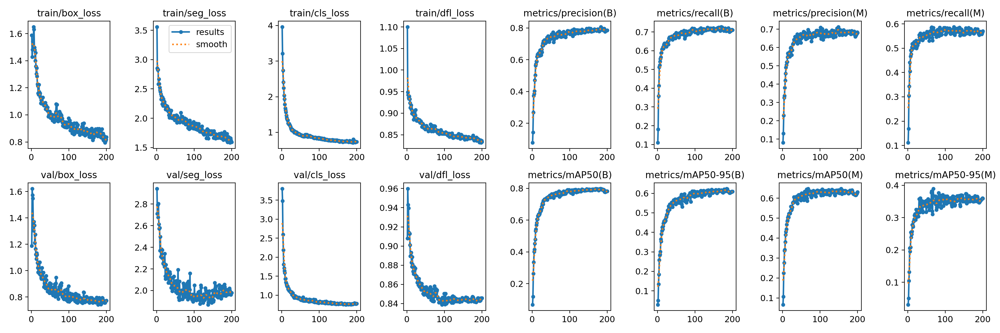

In [2]:
Image("./YOLOV8-data/results/200_epochs_GPU-/results.png")

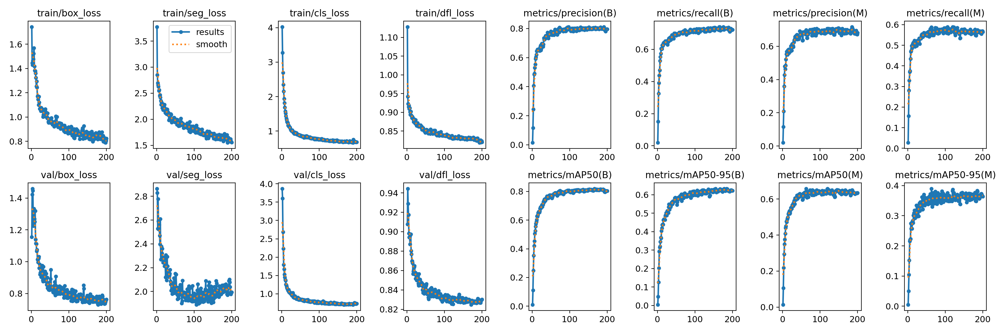

In [10]:
Image("./YOLOV8-data/results/200_epochs_GPU_cle.eroded_labels-/results.png")

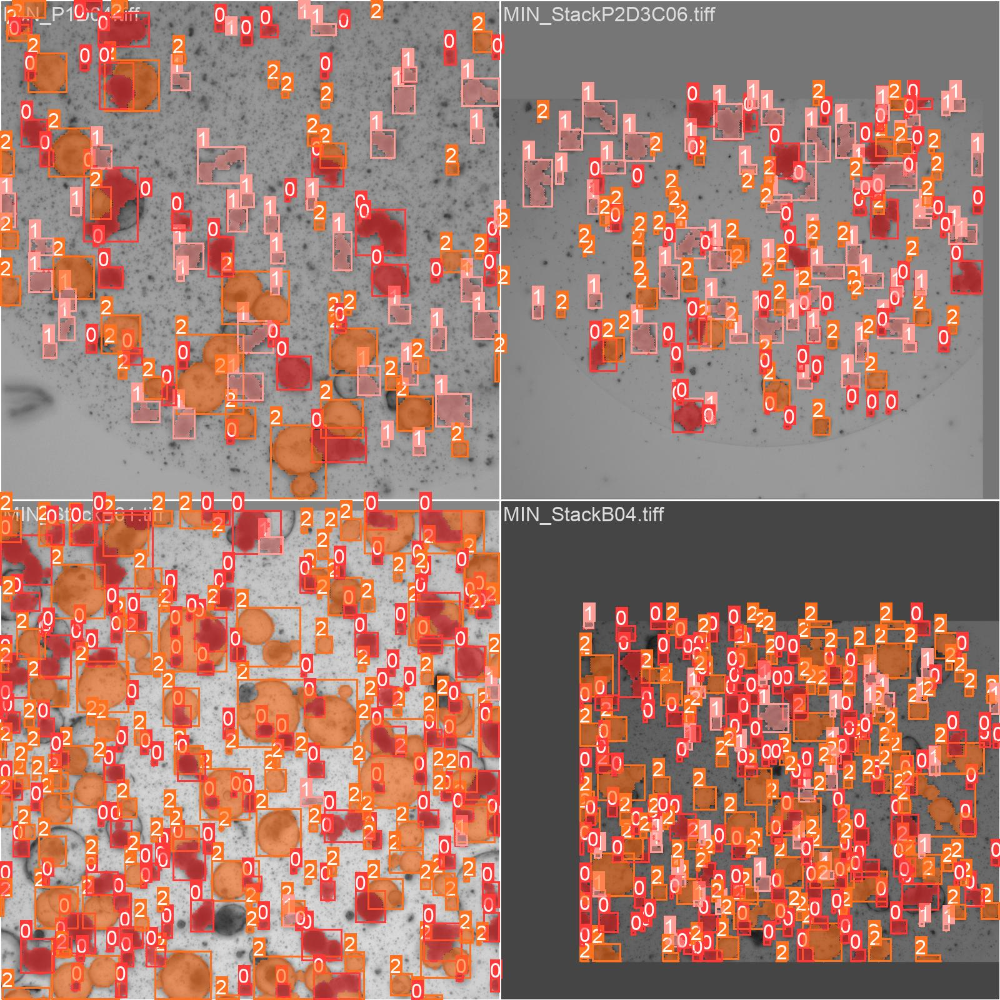

In [7]:
Image(filename="./YOLOV8-data/results/200_epochs_GPU-/train_batch4562.jpg", width=900)

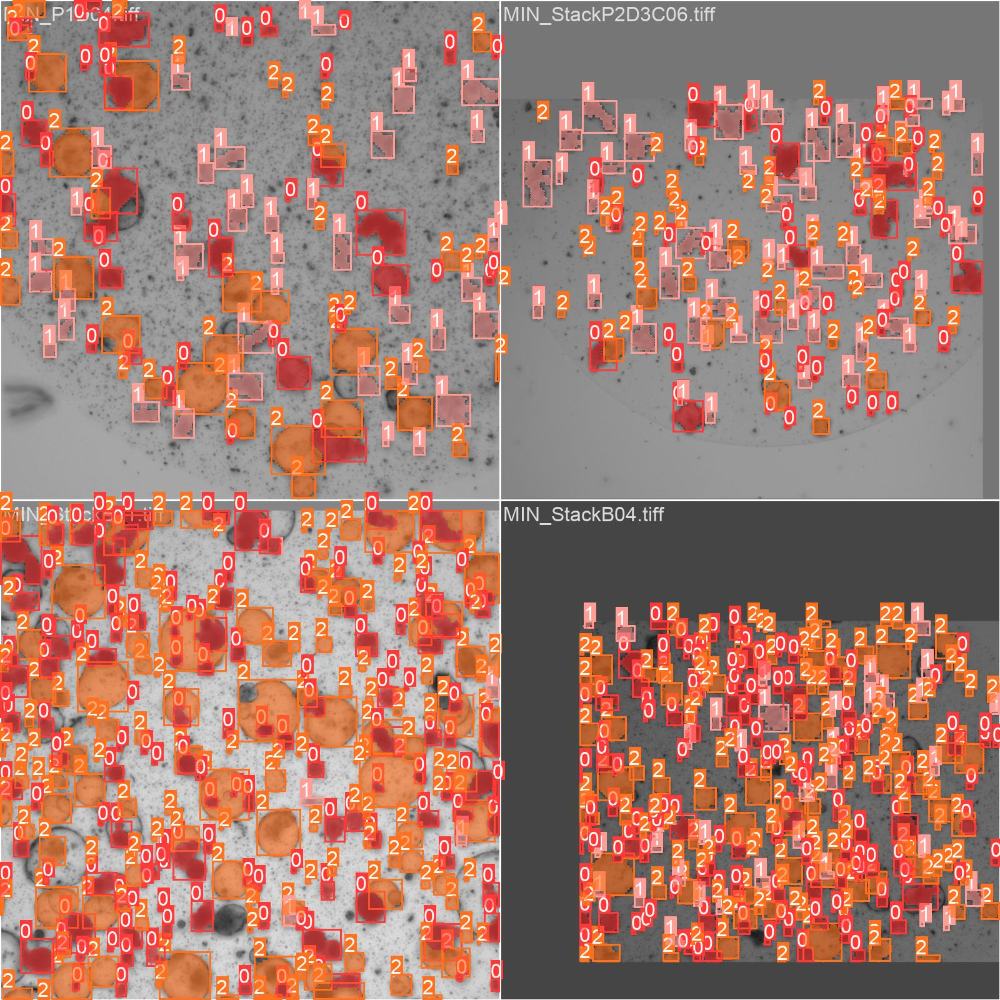

In [11]:

Image(filename="./YOLOV8-data/results/200_epochs_GPU_cle.eroded_labels-/train_batch4562.jpg", width=900)

<h3>Run inference</h3>

Now that our model is trained, we can use it for inference. You can load the best model or the latest. I am picking the latest.

In [4]:
# Loading the latest model
model = YOLO("./YOLOV8-data/results/200_epochs_GPU_cle.eroded_labels-/weights/last.pt")

Load an image and perform inference (segmentation), inference can be also performed on a list of images. The results are stored in a variable <code>results</code>. To toggle on/off labels, confidence, boxes in the output image check [YOLOv8 Plotting Results docs](https://docs.ultralytics.com/modes/predict/#plotting-results)


The cell below uses PIL to display and save the resulting segmentation after inference

In [41]:
# Load the image to perform inference on
image = 'datasets/datasets/yolo_dataset/valid/images/MIN_P1B05.tiff'

# Adjust confidence (conf) threshold and predict
results = model.predict(image, conf=0.6)  

# Results will output a list of results, in this case a list with only 1 prediction that we access using results[0]
im_array = results[0].plot(conf=False, labels=False, boxes=True, line_width=2)
im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
im.show()  # Show image
im.save('results.tiff')


image 1/1 c:\Users\albertds\Python_scripts\bf_intorg_YOLOv8_dev\datasets\datasets\yolo_dataset\valid\images\MIN_P1B05.tiff: 640x800 14 deads, 57 differentiateds, 40 undifferentiateds, 212.4ms
Speed: 4.0ms preprocess, 212.4ms inference, 89.8ms postprocess per image at shape (1, 3, 640, 800)


We can perform the same job using matplotlib to obtain an in-notebook display of the resulting segmentation 


image 1/1 c:\Users\albertds\Python_scripts\bf_intorg_YOLOv8_dev\datasets\datasets\yolo_dataset\valid\images\MIN_P1B05.tiff: 640x800 14 deads, 57 differentiateds, 40 undifferentiateds, 166.1ms
Speed: 4.0ms preprocess, 166.1ms inference, 118.7ms postprocess per image at shape (1, 3, 640, 800)


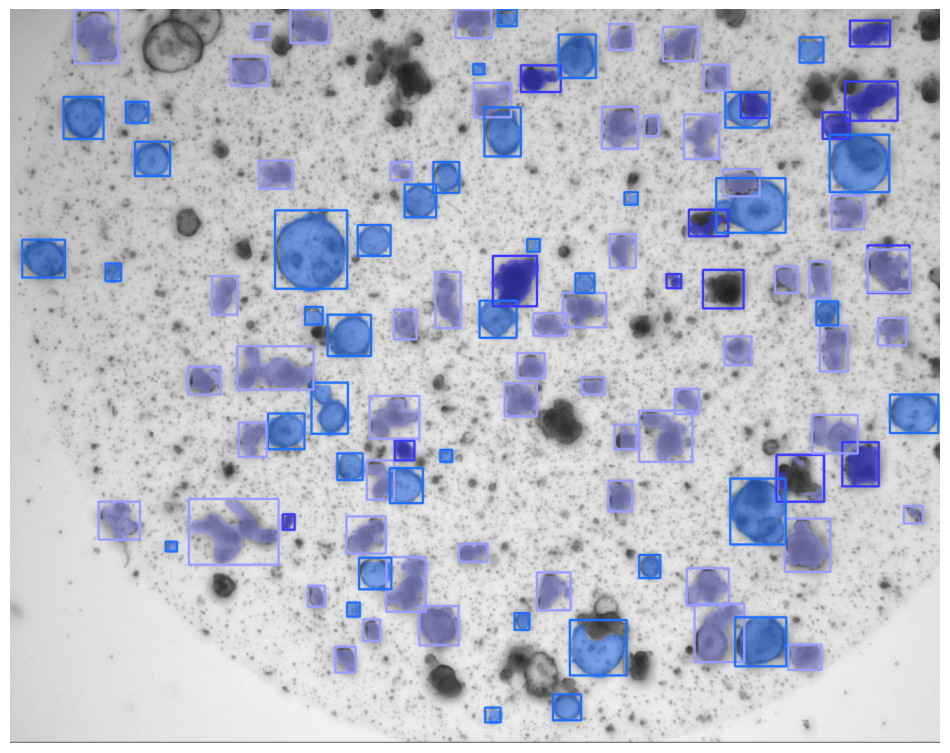

In [53]:
image = 'datasets/datasets/yolo_dataset/valid/images/MIN_P1B05.tiff'
results = model.predict(image, conf=0.6)  # Adjust confidence (conf) threshold

im_array = results[0].plot(conf=False, labels=False, boxes=True, line_width=2)
plt.figure(figsize=(12, 12))
plt.axis("off")
plt.imshow(im_array)
plt.savefig('results.tiff', bbox_inches='tight', pad_inches=0, dpi=200) # Edit dpi based on desired resolution


image 1/1 c:\Users\alber.DESKTOP-VIFBJNG\PythonProjects\bf_intorg_YOLOv8_dev\datasets\datasets\yolo_dataset\valid\images\MIN_P1A01.tiff: 640x800 11 deads, 76 differentiateds, 18 undifferentiateds, 6.5ms
Speed: 287.5ms preprocess, 6.5ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 800)


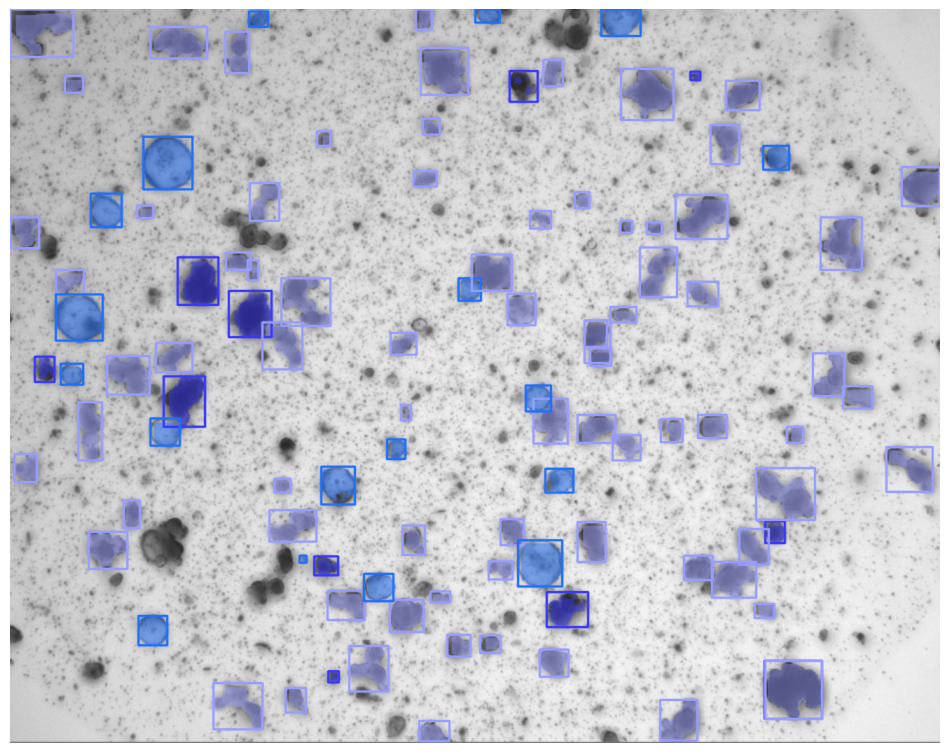

In [6]:
image = 'datasets/datasets/yolo_dataset/valid/images/MIN_P1A01.tiff'
results = model.predict(image, conf=0.6)  # Adjust confidence (conf) threshold

im_array = results[0].plot(conf=False, labels=False, boxes=True, line_width=2)
plt.figure(figsize=(12, 12))
plt.axis("off")
plt.imshow(im_array)
plt.savefig('results.tiff', bbox_inches='tight', pad_inches=0, dpi=200) # Edit dpi based on desired resolution

<h3>Working with results</h3>

All ultralytics <code>predict()</code> calls will return a list of <code>Results</code> objects. To explore in further detail how to access the results check [YOLOv8 Working with Results docs](https://docs.ultralytics.com/modes/predict/#working-with-results).


In [46]:
for result in results:
    boxes = result.boxes  # Boxes object for bbox outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    probs = result.probs  # Class probabilities for classification outputs

**Extracting all segmented masks**

In [70]:
extracted_masks = results[0].masks.data
extracted_masks.shape

torch.Size([111, 640, 800])

In [75]:
# Push the mask to cpu (from GPU) and convert to numpy array for plotting
masks_array = extracted_masks.cpu().numpy()


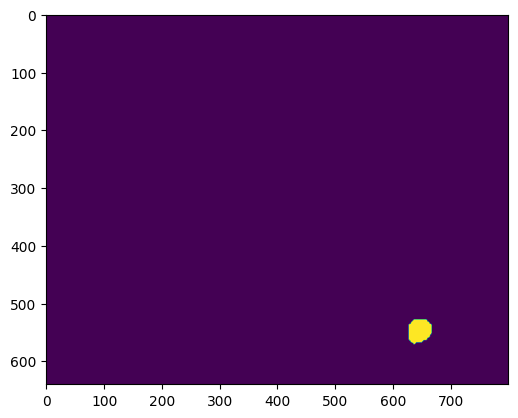

In [72]:
# Show one of the masks 
plt.imshow(masks_array[4])

**Extracting labels for each class**

In [73]:
class_names = results[0].names.values()
class_names

dict_values(['dead', 'differentiated', 'undifferentiated'])

In [80]:
result = results[0]

# Extract the boxes, which contain class IDs
detected_boxes = result.boxes.data

# Extract class IDs from the detected boxes
class_labels = detected_boxes[:, -1].int().tolist()

# Initialize a dictionary to hold masks by class
masks_by_class = {name: [] for name in result.names.values()}

# Iterate through the masks and class labels
for mask, class_id in zip(extracted_masks, class_labels):
    class_name = result.names[class_id]  # Map class ID to class name
    masks_by_class[class_name].append(mask.cpu().numpy())

In [81]:
for class_name, masks in masks_by_class.items():
    print(f"Class Name: {class_name}, Number of Masks: {len(masks)}")


Class Name: dead, Number of Masks: 14
Class Name: differentiated, Number of Masks: 57
Class Name: undifferentiated, Number of Masks: 40


**Calculating region properties for all objects and saving to a csv file**

You can find an available list of region properties in [skimage documentation](https://scikit-image.org/docs/stable/api/skimage.measure.html#skimage.measure.regionprops).

In [103]:
import pandas as pd
from skimage.measure import regionprops
import math

# Initialize a list to store the properties
props_list = []

# Iterate through all classes
for class_name, masks in masks_by_class.items():
    # Iterate through the masks for this class
    for mask in masks:
        # Convert the mask to an integer type if it's not already
        mask = mask.astype(int)

        # Apply regionprops to the mask
        props = regionprops(mask)

        # Extract the properties you want (e.g., area, perimeter) and add them to the list
        for prop in props:
            area = prop.area
            area_filled = prop.area_filled
            perimeter = prop.perimeter
            circularity = min(1, (4 * math.pi * prop.area) / prop.perimeter**2)
            # Add other properties as needed

            # Append the properties and class name to the list
            props_list.append({'Class Name': class_name,
                               'Area': area,
                               'Area_filled': area_filled,
                               'Perimeter': perimeter,
                               'Circularity': circularity})

# Convert the list of dictionaries to a DataFrame
props_df = pd.DataFrame(props_list)

# Now props_df contains the properties and class names for all regions

# Save the DataFrame to a CSV file
props_df.to_csv('./YOLOv8_object_properties.csv', index=False)

C:\Users\albertds\AppData\Local\Temp\ipykernel_18972\2361306281.py:23: RuntimeWarning: divide by zero encountered in scalar divide
  circularity = min(1, (4 * math.pi * prop.area) / prop.perimeter**2)


In [104]:
props_df

,Class Name,Area,Area_filled,Perimeter,Circularity
0,dead,1145.0,1145.0,133.497475,0.807364
1,dead,450.0,450.0,88.526912,0.721559
2,dead,802.0,802.0,111.112698,0.816313
3,dead,112.0,112.0,44.142136,0.722306
4,dead,218.0,218.0,52.384776,0.998289
...,...,...,...,...,...
106,undifferentiated,56.0,56.0,25.071068,1.000000
107,undifferentiated,1403.0,1403.0,166.710678,0.634367
108,undifferentiated,60.0,60.0,25.656854,1.000000
109,undifferentiated,147.0,147.0,43.313708,0.984638


**Plotting results**

In [105]:
import seaborn as sns

**Swarm plot**

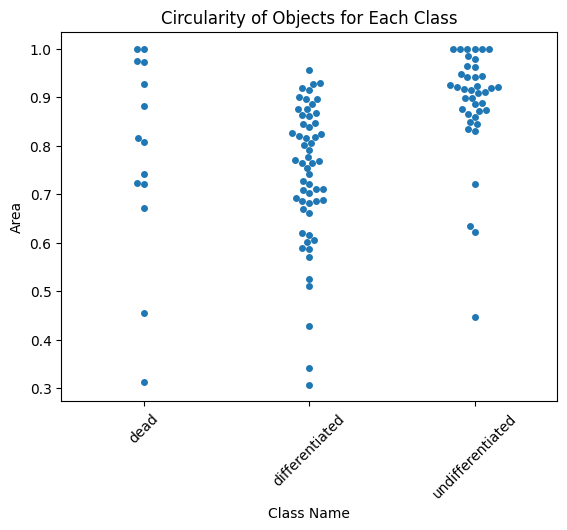

In [106]:
# Create the swarm plot with Seaborn
sns.swarmplot(x='Class Name', y='Circularity', data=props_df)

# Add labels and a title
plt.xlabel('Class Name')
plt.ylabel('Area')
plt.title('Circularity of Objects for Each Class')

# Rotate the x-axis labels for better visibility if needed
plt.xticks(rotation=45)

# Show the plot
plt.show()

**Box Plot**

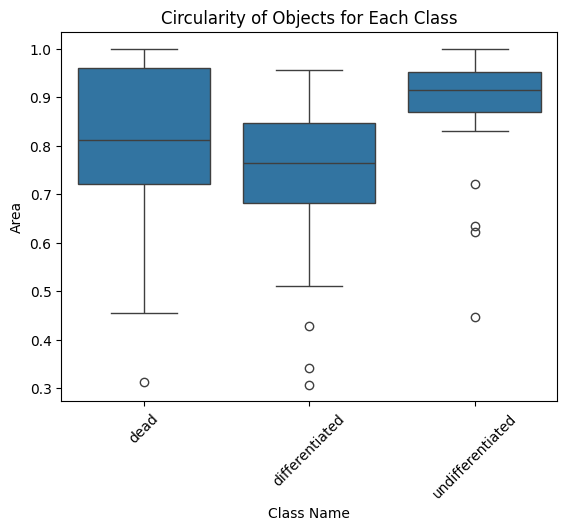

In [107]:
sns.boxplot(x='Class Name', y='Circularity', data=props_df)
# Add labels and a title
plt.xlabel('Class Name')
plt.ylabel('Area')
plt.title('Circularity of Objects for Each Class')

# Rotate the x-axis labels for better visibility if needed
plt.xticks(rotation=45)

# Show the plot
plt.show()